# SRGAN

**librairies**

In [1]:
import glob
import shutil
import random
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from data import STFDOGS20580
from model.srgan import generator, discriminator
from train2 import SrganTrainer, SrganGeneratorTrainer

C:\Users\lyesw\anaconda3\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
import sys
print(sys.executable)

C:\Users\lyesw\anaconda3\python.exe


In [3]:
%load_ext tensorboard


**paramètres GPU**

In [4]:
gpus = tf.config.experimental.list_physical_devices('GPU')

for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

print("Nombre de GPU disponible : ", len(gpus))

Nombre de GPU disponible :  0


**paramètres divers**

In [5]:
# dossier sauvegarde des poids
WEIGHTS_DIR = 'weights/srgan'

# nombre d'images selectionnés aléatoirement dans le dataset
N_IMAGES = 5000

**fonctions diverses**

In [6]:
weights_file = lambda filename: os.path.join(WEIGHTS_DIR, filename)

**téléchargement du dataset / interpolation x4 / séparation des données**

la classe STFDOGS20580 s'occupe des données
les images sont stockées dans le dossier `.stfdogs20580` du répertoire racine du projet   
le dataset est téléchargé depuis le dépôt officiel et préparé automatiquement   
la fonction remove_data() supprime tous les données sur 'True'

In [7]:
stfdogs20580_train = STFDOGS20580(subset='train', n_images=N_IMAGES)
stfdogs20580_valid = STFDOGS20580(subset='valid', n_images=N_IMAGES)

In [8]:
stfdogs20580_train.remove_data(images_archive=False, images_preprocessed=False, cache=False)

In [9]:
train_ds = stfdogs20580_train.dataset(batch_size=16, random_transform=True)
valid_ds = stfdogs20580_valid.dataset(batch_size=16, random_transform=True, repeat_count=1)

**modélisations**

nous allons pré-entrainé le génerateur sur la fonction de perte MSE afin de fournir un générateur initialisé et puis nous allons améliorer la performance avec une méthode adverse

In [10]:
#Création du dossier pour les sauvegardes
os.makedirs(WEIGHTS_DIR, exist_ok=True)

In [11]:
from model import resolve_single
from utils import load_image

**pré-entrainement du générateur sur MSE loss**

In [12]:
from train2 import SrganTrainer, SrganGeneratorTrainer
pre_trainer = SrganGeneratorTrainer(model=generator(), checkpoint_dir=f'.ckpt/pre_generator')


Model restored from checkpoint at step 20000.


In [13]:
pre_trainer.train(train_ds,
                  valid_ds.take(100),
                  steps=20000, 
                  evaluate_every=1000, 
                  save_best_only=False)



In [14]:
pre_trainer.model.save_weights(weights_file('pre_generator.weights.h5'))

**entrainement du générateur et discriminateur sur perception loss**

In [15]:
from train2 import SrganTrainer, SrganGeneratorTrainer

In [16]:
gan_generator = generator()
gan_generator.load_weights(weights_file('pre_generator.weights.h5'))



In [17]:
gan_trainer = SrganTrainer(generator=gan_generator, discriminator=discriminator())


C:\Users\lyesw\AppData\Roaming\Python\Python39\site-packages\keras\src\layers\activations\leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


In [18]:
gan_trainer.train(train_ds,
                  steps=5000)

50/5000, perceptual loss = 0.3444, discriminator loss = 1.5464
100/5000, perceptual loss = 0.3322, discriminator loss = 0.5362
150/5000, perceptual loss = 0.3377, discriminator loss = 0.2568
200/5000, perceptual loss = 0.3342, discriminator loss = 0.0667
250/5000, perceptual loss = 0.3347, discriminator loss = 0.1646
300/5000, perceptual loss = 0.3272, discriminator loss = 0.1717
350/5000, perceptual loss = 0.3350, discriminator loss = 0.0122
400/5000, perceptual loss = 0.3276, discriminator loss = 0.0234
450/5000, perceptual loss = 0.3484, discriminator loss = 0.3397
500/5000, perceptual loss = 0.3272, discriminator loss = 0.0011
550/5000, perceptual loss = 0.3247, discriminator loss = 0.0453
600/5000, perceptual loss = 0.3355, discriminator loss = 0.0257
650/5000, perceptual loss = 0.3446, discriminator loss = 0.0746
700/5000, perceptual loss = 0.3229, discriminator loss = 0.0081
750/5000, perceptual loss = 0.3302, discriminator loss = 0.0688
800/5000, perceptual loss = 0.3320, discr

In [19]:
gan_trainer.generator.save_weights(weights_file('gan_generator.weights.h5'))
gan_trainer.discriminator.save_weights(weights_file('gan_discriminator.weights.h5'))

**visualisation des performances**

In [20]:
pre_generator = generator()
gan_generator = generator()

pre_generator.load_weights(weights_file('pre_generator.weights.h5'))
gan_generator.load_weights(weights_file('gan_generator.weights.h5'))

In [21]:
from model import resolve_single
from utils import load_image

def resolve_and_plot(lr_image_path):
    lr = load_image(lr_image_path)
    
    pre_sr = resolve_single(pre_generator, lr)
    gan_sr = resolve_single(gan_generator, lr)
    
    plt.figure(figsize=(20, 20))
    
    images = [lr, pre_sr, gan_sr]
    titles = ['LR', 'SR (PRE)', 'SR (GAN)']
    positions = [1, 3, 4]
    
    for i, (img, title, pos) in enumerate(zip(images, titles, positions)):
        plt.subplot(2, 2, pos)
        plt.imshow(img)
        plt.title(title)
        plt.xticks([])
        plt.yticks([])

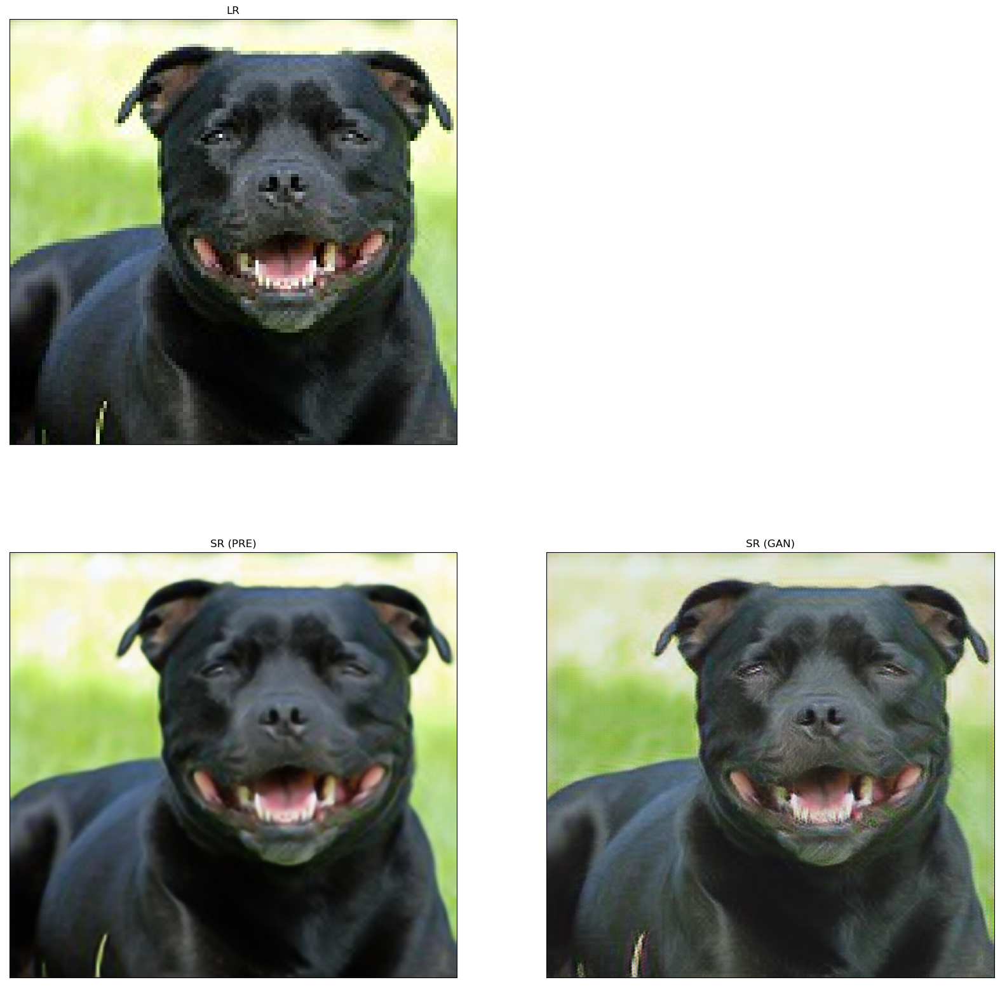

In [22]:
resolve_and_plot('demo/dog-crop.jpg')

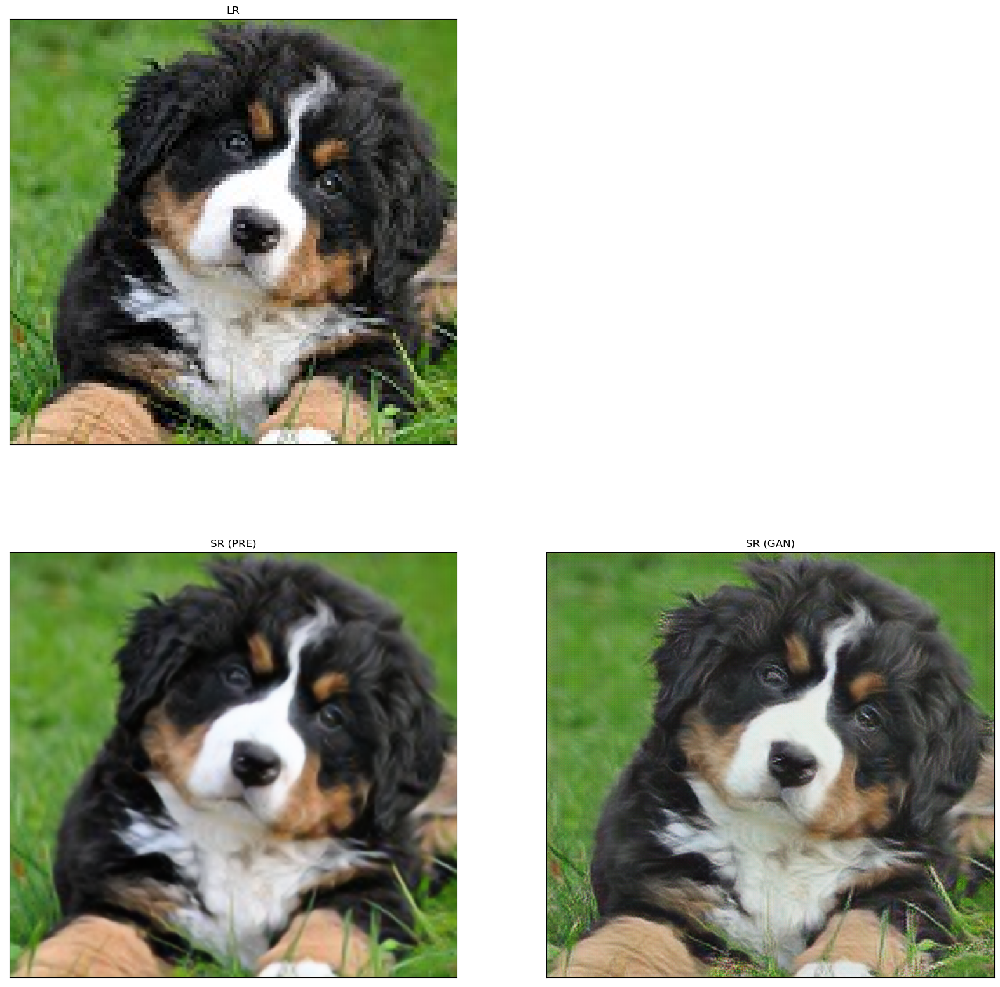

In [23]:
resolve_and_plot('demo/dog-crop2.jpg')

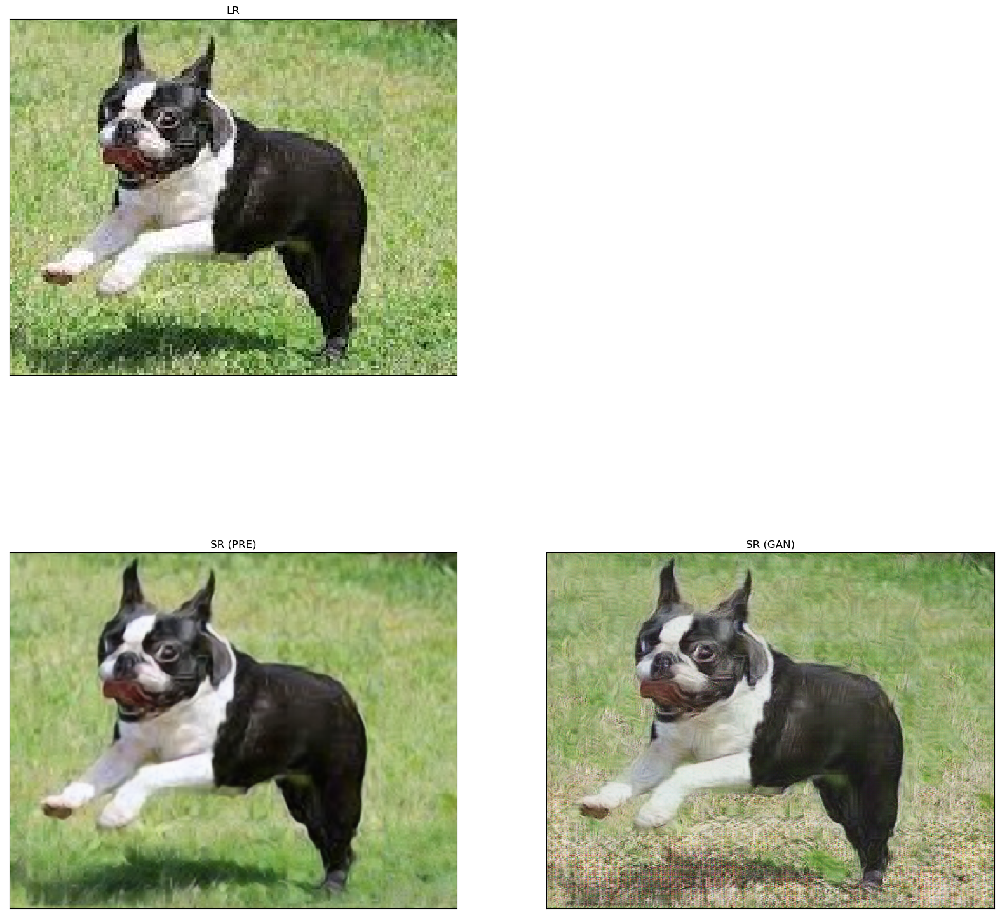

In [24]:
resolve_and_plot('demo/boston_bull_test.jpg')

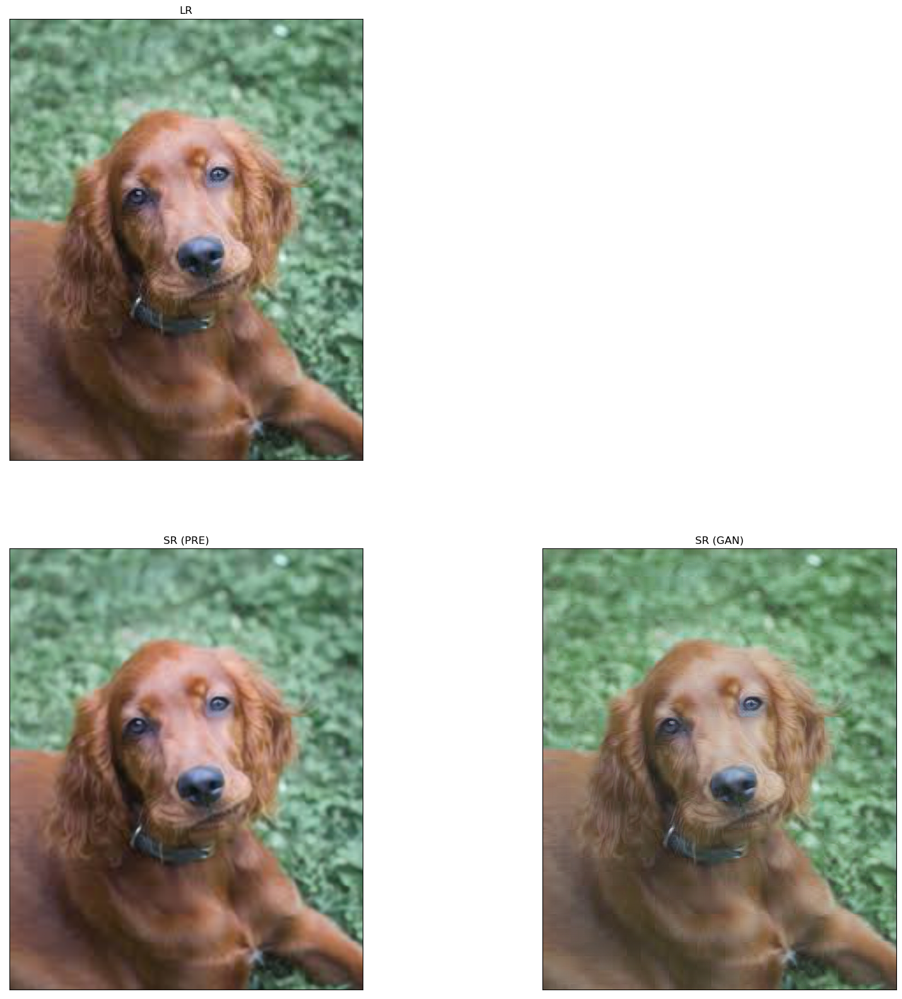

In [25]:
resolve_and_plot('demo/irish_setter_test.jpg')

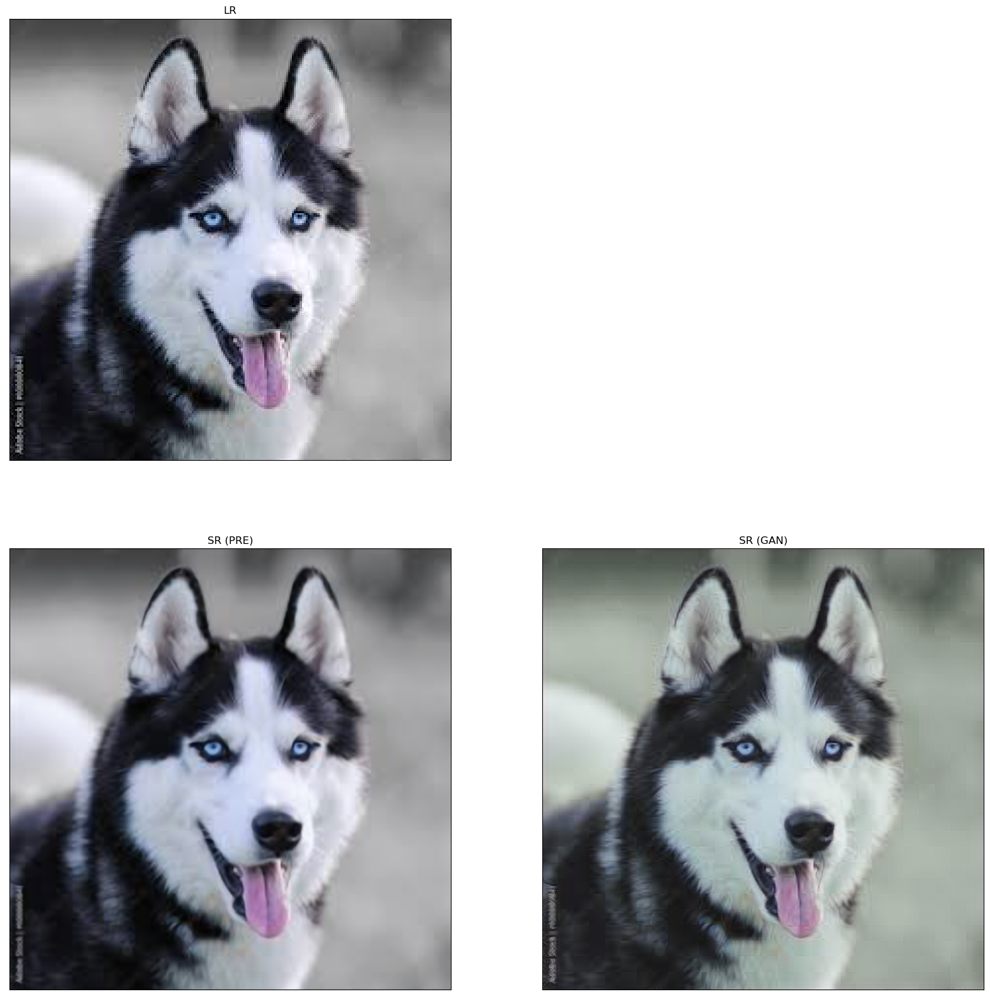

In [26]:
resolve_and_plot('demo/husky_test.jpg')

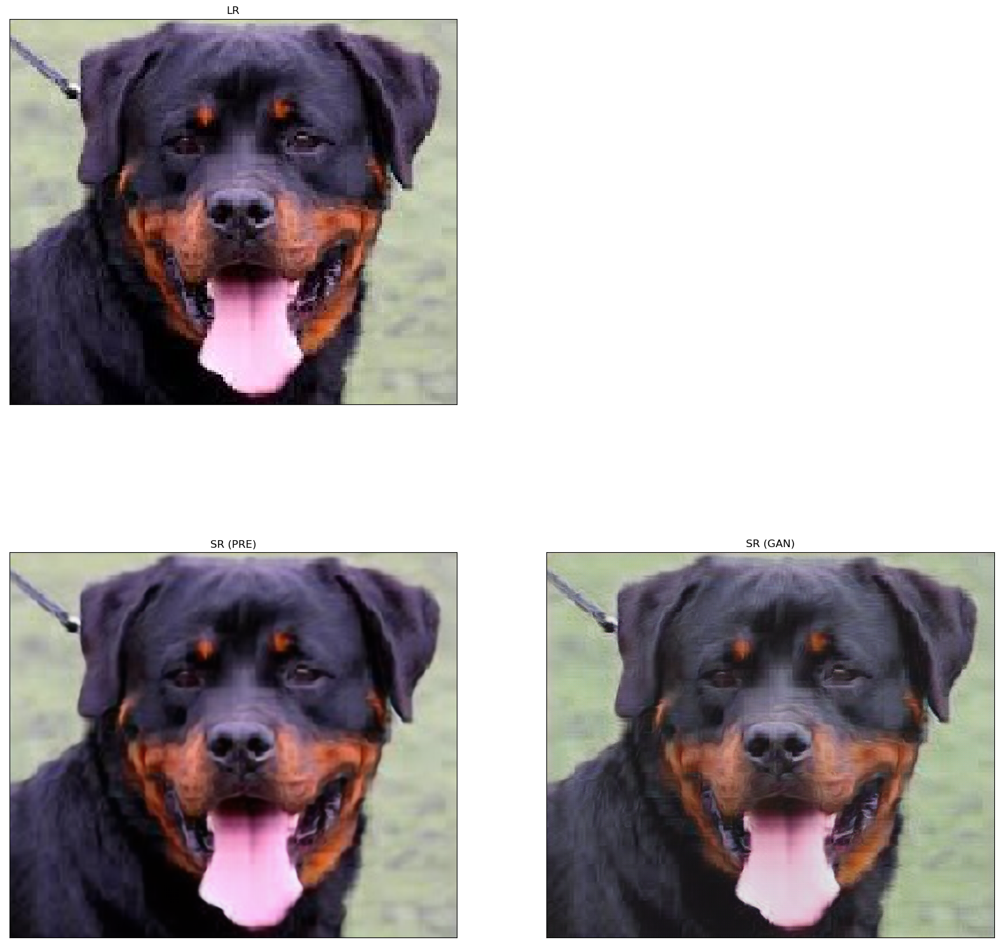

In [27]:
resolve_and_plot('demo/rottweiler_test.jpg')